# Interpreting Language Models with Contrastive Explanations: Replication
### ___Ben Wachspress and Kevin Weng___
This Colab notebook is adapted from [Yin and Neubig (2022)](https://github.com/kayoyin/interpret-lm).


In [1]:
!pip install datasets
from datasets import load_dataset

dataset = load_dataset('wikitext', 'wikitext-103-raw-v1')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 401.2/401.2 kB 14.0 MB/s eta 0:00:00
  Attempting uninstall: huggingface-hub
    Found existing installation: huggingface-hub 0.20.3
    Uninstalling huggingface-hub-0.20.3:
      Successfully uninstalled huggingface-hub-0.20.3


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating test split:   0%|          | 0/4358 [00:00<?, ? examples/s]

Generating train split:   0%|          | 0/1801350 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/3760 [00:00<?, ? examples/s]

In [2]:
from collections import Counter
from itertools import chain
import string

# Combine text data from all sets
all_texts = list(chain(dataset['train']['text'], dataset['validation']['text'], dataset['test']['text']))

# Tokenize and count word frequencies

# Tokenize and count word frequencies, removing symbols and dashes
word_counts = Counter(word.lower() for text in all_texts for word in text.split() if any(c.isalpha() or c.isdigit() for c in word))

# Get the top 1000 words
top_1000_words = [word for word, _ in word_counts.most_common(1000)]

In [3]:
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

tagged_words = nltk.pos_tag(top_1000_words)

# Initialize dictionaries to store top words for each part of speech
top_words_by_pos = {'NN': [], 'DT': [], 'JJ': [], 'RB': [], 'IN': [], 'VB': [], 'CD': [], 'PRP': []}

# Collect top words for each part of speech
for word, pos in tagged_words:
    if pos in top_words_by_pos and len(top_words_by_pos[pos]) < 10:
        top_words_by_pos[pos].append(word)

# Print the top 10 words for each part of speech
for pos, words in top_words_by_pos.items():
    print(f"Top 10 {pos}:", words)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


Top 10 NN: ['time', 'i', 'game', 'film', 'year', 'season', 'war', 'world', 'series', 'city']
Top 10 DT: ['the', 'a', 'an', 'this', 'all', 'some', 'both', 'these', 'no', 'each']
Top 10 JJ: ['new', 'other', 'such', 'second', 'many', 'north', 'united', 'several', 'early', 'south']
Top 10 RB: ['first', 'not', 'also', 'only', 'later', 'out', 'however', 'then', 'song', 'album']
Top 10 IN: ['of', 'in', 'on', 'as', 'for', 'that', 'with', 'by', 'at', 'from']
Top 10 VB: ['be', 'have', 'work', 'september', 'rock', 'ten', 'sent', 'chart', 'hit', 'section']
Top 10 CD: ['one', 'two', '1', 'three', '2', '3', '000', '5', 'four', '4']
Top 10 PRP: ['he', 'it', 'they', 'she', 'him', 'them', 'us', 'you', 'we', 'himself']


In [4]:
import random
import re

# Function to check if a sentence contains the word exactly
def contains(sentence, target_word):
    pattern = r'\b' + re.escape(target_word.lower()) + r'\b'
    return bool(re.search(pattern, sentence.lower(), flags=re.IGNORECASE))

# Function to split each sentence at the split word and keep only the part before it
def split(sentence, target_word):
    pattern = r'\b' + re.escape(target_word.lower()) + r'\b'
    return re.split(pattern, sentence, 1, flags=re.IGNORECASE)[0]


def get_sentences(texts, target_word):
  # List to store cut sentences
  cut_sentences = []

  # Iterate over all_texts and select sentences containing the word "he"
  for text in texts:
      if contains(text, target_word):
          cut_part = split(text, target_word)
          length = len(cut_part.split())
          if length >= 10 and length <= 30:
              cut_sentences.append(cut_part)

  # Randomly select 10 sentences containing the word "he"
  random_cut_sentences = random.sample(cut_sentences, k=min(5, len(cut_sentences)))

  return random_cut_sentences

In [5]:
print('Installing dependencies...')
!pip3 install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113
!pip install transformers
!git clone https://github.com/kevinjeffweng/COS484_Final.git &> /dev/null

print('Importing libraries...')
import sys
sys.path.append('./COS484_Final')
from lm_saliency_GPT2 import *

print('Done!')

if not torch.cuda.is_available():
  print("Please restart runtime with GPU")

Installing dependencies...
Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu113
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvt

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

Done!


In [6]:
model_name = "gpt-2"

if model_name == "gpt-2":
  tokenizer = GPT2Tokenizer.from_pretrained("gpt2")
  model = GPT2LMHeadModel.from_pretrained("gpt2")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
assert device.type == "cuda"
model.to(device)

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

GPT2LMHeadModel(
  (transformer): GPT2Model(
    (wte): Embedding(50257, 768)
    (wpe): Embedding(1024, 768)
    (drop): Dropout(p=0.1, inplace=False)
    (h): ModuleList(
      (0-11): 12 x GPT2Block(
        (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): GPT2Attention(
          (c_attn): Conv1D()
          (c_proj): Conv1D()
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (mlp): GPT2MLP(
          (c_fc): Conv1D()
          (c_proj): Conv1D()
          (act): NewGELUActivation()
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
    )
    (ln_f): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (lm_head): Linear(in_features=768, out_features=50257, bias=False)
)

In [7]:
from collections import Counter
from sklearn.cluster import KMeans
import numpy as np

def run_all(target_word, inputs: list, top_1000_words):
  target = target_word
  target_idx = top_1000_words.index(target)
  explanation = "gradient norm"
  # explanation = "input x gradient"
  word_counter = Counter()

  clusters_dict = {}  # Dictionary to hold cluster indices for each input
  contrastive_dict = {}  # Dictionary to hold contrastive explanations for each input
  target_dict = {}  # Dictionary to hold target words for each input


  for i, input in enumerate(inputs):
    input = input.strip() + " "
    input_tokens = tokenizer(input)['input_ids']
    attention_ids = tokenizer(input)['attention_mask']

    preds = model_preds(model, [input_tokens], [attention_ids], -1, tokenizer, foils=None, k=10, verbose=True)

    base_grad = 0
    contra_grad = 0

    for j, word in enumerate(top_1000_words):
      foil = word

      CORRECT_ID = tokenizer(" "+ target)['input_ids'][0]
      FOIL_ID = tokenizer(" "+ foil)['input_ids'][0]

      base_saliency_matrix, base_embd_matrix = saliency(model, input_tokens, attention_ids)
      saliency_matrix, embd_matrix = saliency(model, input_tokens, attention_ids, foil=FOIL_ID)

      base_explanation = l1_grad_norm(base_saliency_matrix, normalize=True)
      contra_explanation = l1_grad_norm(saliency_matrix, normalize=True)

      if (j == 0):
        base_grad = np.array(base_explanation).reshape((1, -1))
        contra_grad = np.array(contra_explanation)
      else:
        contra_grad = np.row_stack((contra_grad, np.array(contra_explanation)))


    # Concatenate base_grad and contra_grad arrays
    all_grads = np.concatenate((contra_grad, base_grad), axis=0)

    # Run k-means clustering
    kmeans = KMeans(n_clusters=100, random_state=10)  # You can choose the number of clusters here
    kmeans.fit(all_grads)

    # Get indices of inputs belonging to the cluster containing base_grad
    cluster_indices = np.where(kmeans.labels_ == kmeans.labels_[target_idx])[0]

    unique_labels = np.unique(kmeans.labels_)

    # Iterate over each cluster
    for label in unique_labels:
        # Get indices of inputs belonging to the current cluster
        cluster_indice = np.where(kmeans.labels_ == label)[0]
        tops = [top_1000_words[i] for i in cluster_indice[:-1]]

        # Print cluster label and indices
        print(f"Cluster {label}: {cluster_indice} : {tops}")

    top_words_at_indices = [top_1000_words[k] for k in cluster_indices if k < 1000]
    save_contragrad = [contra_grad[k] for k in cluster_indices if k < 1000]

    # Save indices to the dictionary
    clusters_dict[i] = top_words_at_indices
    target_dict[i] = base_grad
    contrastive_dict[i] = save_contragrad

  # Return the dictionary containing cluster indices for each input
  return clusters_dict, target_dict, contrastive_dict

## Anaphor Agreement

In [8]:
random.seed(484)
target = "he"
sents = get_sentences(all_texts, target)
sents

[' In 1926 , Rabearivelo married Mary Razafitrimo , the daughter of a local photographer , and together they had five children . ',
 " The Egyptian army unleashed its full anti @-@ aircraft arsenal and hit Alon 's plane , but ",
 " 'Bagga ' Barnes was also Bill 's room @-@ mate , and his affection for his late lamented pal , a lovable rogue , was obvious . ",
 ' Fàbregas was fitted with a protective mask after breaking his nose in a collision with Charlie Adam during the reverse fixture on 4 April . Eight days later , ',
 ' Columnist Leonard Pitts of The Miami Herald described his difficulty sitting down to read a book , in which ']

In [9]:
# Example usage
clusters, target_grad, contrastive_grad = run_all(target, sents, top_1000_words)
for cluster_name, elements in clusters.items():
  print(f"Cluster number: {cluster_name}")
  print(elements)
# for target_name, elements in target_grad.items():
#   print(f"Target number: {target_name}")
#   print(elements)
# for contrastive_name, elements in contrastive_grad.items():
#   print(f"Contrastive number: {contrastive_name}")
#   print(elements)

Top model predictions:
0.389: .
0.188: :
0.134: ,
0.085: .
0.038: ,
0.023:  and
0.016:  :
0.016:  (
0.012: ;
0.009:  of


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [308 374 476 485 554 578 586 626 676 757 800 886 921 941 982] : ['career', 'produced', 'construction', 'performed', 'completed', 'region', 'worked', 'example', 'association', 'spent', 'study', 'commercial', 'proposed', 'intended']
Cluster 1: [184 420 629 747 830] : ['0', '24', 'c', 'paul']
Cluster 2: [261 329 387 428 435 493 526 576 607 672 743 834] : ['ship', 'island', 'ships', 'rock', 'sea', 'george', 'football', 're', 'cup', 'radio', 'gold']
Cluster 3: [ 74  79 227 336 391 418 437 473 644 665 817] : ['year', 'season', 'wrote', 'version', 'western', 'age', 'return', 'act', 'mid', 'co']
Cluster 4: [ 67 204 243 351 361 381 404 577 604 653] : ['between', 'based', 'video', 'given', 'gave', 'television', 'per', 'ground', 'provided']
Cluster 5: [130 369 379 636 701 772 781 782 803 841 899 969 971] : ['began', 'returned', 'recorded', 'joined', 'ended', 'failed', 'battalion', 'evidence', 'claimed', 'arrived', 'depression', 'upper']
Cluster 6: [ 76 108 134 265 544 631 693 708] : ['

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 35  68 127 144 158 195 212 228 275 284 317 325 342 381 404 889 942 964
 992] : ['its', 'there', 'could', 'around', 'another', 'third', 'company', 'according', 'again', 'further', 'without', 'half', 'different', 'television', 'per', 'running', 'immediately', 'related']
Cluster 1: [213 555 677 860 982] : ['army', 'population', 'largest', 'structure']
Cluster 2: [ 71 101 117 400 472 547 592 640 660 665 727 742 907] : ['film', 'city', 'music', 'star', 'college', 'director', 'event', 'hours', 'minutes', 'co', 'space', 'board']
Cluster 3: [224 302 376 668 757 943] : ['band', 'player', 'went', 'met', 'spent']
Cluster 4: [272 839 840 891 910] : ['february', 'debut', 'commander', 'virginia']
Cluster 5: [162 267 296 437 499 500 671 722 828] : ['took', 'club', 'match', 'return', 'taken', 'able', 'shot', 'appearance']
Cluster 6: [ 30 104 147 405 415 423 441 598 622 627 679 865 912] : ['their', 'became', 'each', 'throughout', 'characters', 'instead', 'ten', 'records', 'generally', 'eve

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 56  89 144 425 431 546 681] : ['over', 'through', 'around', 'writing', 'across', 'see']
Cluster 1: [167 298 375 537 555 720 789 818 875 900 919] : ['group', 'white', 'position', 'formed', 'population', 'relationship', 'term', 'person', 'carried', 'appointed']
Cluster 2: [571 634 723 883 966] : ['2004', '2003', '2002', '1999']
Cluster 3: [261 372 387 402 449 491 897 943] : ['ship', 'royal', 'ships', 'women', 'southern', 'northern', 'naval']
Cluster 4: [ 57  75  88 164 183 214 286 316 321 362 369 392 438 469 496 501 556 560
 715 722 774 799 847 854 925 940 945 980 989] : ['him', 'made', 'used', 'use', 'government', 'history', 'service', 'came', 'take', 'never', 'returned', 'run', 'developed', 'reached', 'level', 'works', 'command', 'open', 'business', 'appearance', 'money', 'room', 'services', 'operations', 'hot', 'nature', 'supported', 'plans']
Cluster 5: [279 341 471 581] : ['11', '25', '22']
Cluster 6: [102 154 171 186 260 272 319 368 379 385 436 493 545 551 607 619 624 7

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [237 554 591 621 877 900] : ['own', 'completed', 'towards', 'placed', 'material']
Cluster 1: [138 193 350 489 635 755 818 850] : ['people', '9', 'court', 'member', '500', 'female', 'person']
Cluster 2: [ 10  65 126 145 220 245 346 367 473 503 761 814 913 955] : ['for', 'out', 'although', 'long', 'name', 'named', 'lost', 'tour', 'act', 'action', 'give', 'usually', 'today']
Cluster 3: [116 141 449 491 741 863] : ['south', 'million', 'southern', 'northern', 'rights']
Cluster 4: [  1  24  46 104 165 254 256 271 289 297 392 453 553 574 689 699 715 772
 938] : ['of', 'be', 'time', 'became', 'any', 'way', 'make', 'old', 'do', 'story', 'run', 'too', 'go', 'non', 'change', 'turned', 'business', 'failed']
Cluster 5: [262 428 587 870 874 925] : ['production', 'rock', 'france', 'queen', 'earth']
Cluster 6: [ 25  30 199 259 357 512 564 575 647 766 823 836 860 862] : ['this', 'their', 'large', '30', 'little', 'others', 'soon', 'case', 'believed', 'attempt', 'loss', 'mark', 'structure']
Cl

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [141 209 508 602 661 666 678 738 824 842 996] : ['million', 'just', 'success', 'least', 'earlier', 'successful', 'highest', '31', 'education', 'richard']
Cluster 1: [147 184 199 306 333 377 467 496 501 517 822 880 940] : ['each', '0', 'large', 'order', 'form', 'short', 'style', 'level', 'works', 'modern', 'limited', 'living']
Cluster 2: [ 81  98 328 382 481 507 634 723 908 950 978] : ['000', 'album', '2007', '2006', '2005', 'born', '2003', '2002', 'shortly', 'awarded']
Cluster 3: [100 212 216 251 335 472 521 539 644 742 764] : ['team', 'company', 'road', 'late', 'development', 'college', 'project', 'site', 'mid', 'board']
Cluster 4: [532 703 806 817 833 881] : ['feet', 'units', 'square', 'novel', 'stars']
Cluster 5: [126 218 338 393 486 530 551 613 621 625 649 705 895 956 984 985 995] : ['although', 'included', 'moved', 'include', 'served', 'caused', 'saw', 'allowed', 'placed', 'runs', 'replaced', 'section', 'entered', 'helped', 'changed', 'appear']
Cluster 6: [ 47  60  97 1

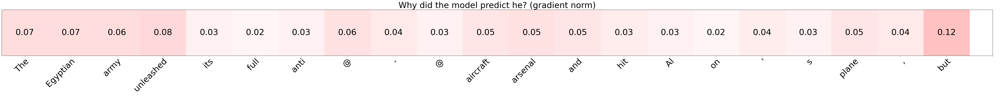

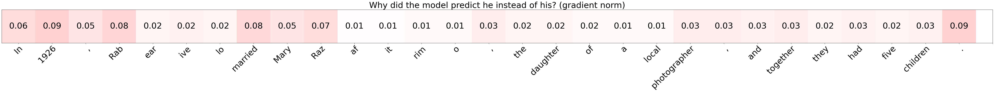

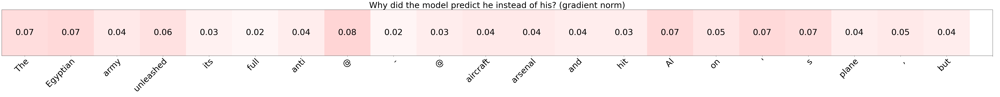

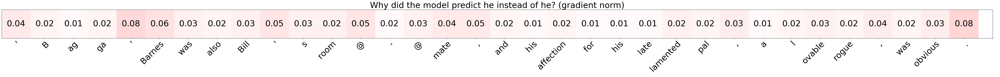

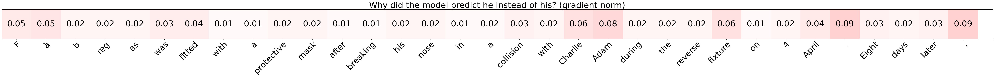

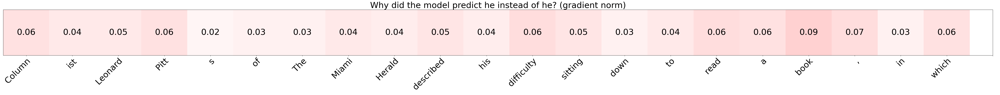

In [10]:
input_tokens = tokenizer(sents[1])['input_ids']
explanation = "gradient norm"
# explanation = "input x gradient"

visualize(target_grad[1][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target}? ({explanation})")

for i in range(5):
  input_tokens = tokenizer(sents[i])['input_ids']
  foil_ = clusters[i][0]
  visualize(contrastive_grad[i][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target} instead of {foil_}? ({explanation})")

## Subject-Verb Agreement

In [11]:
random.seed(13)
target = "go"
sents = get_sentences(all_texts, target)
sents

[' In the year 200X , robots developed to assist mankind are commonplace thanks to the efforts of renowned robot designer Dr. Light . However , one day these robots ',
 ' In 1992 , Biondo played a tape of Cassidy \'s voice for Chuck Brown , the " Godfather of ',
 ' This was followed by Pertjobaan Setia ( A Test of Faithfulness ) in 1931 , a novel about a young man named Sjamsoeddin who is required to ',
 ' As the two worlds begin to merge , Dusk and Alba reveal their plans to ',
 ' I am sitting in a completely empty apartment waiting for my American visa . I have misgivings as to how it will ']

In [12]:
# Example usage
clusters, target_grad, contrastive_grad = run_all(target, sents, top_1000_words)
for cluster_name, elements in clusters.items():
  print(f"Cluster number: {cluster_name}")
  print(elements)
# for target_name, elements in target_grad.items():
#   print(f"Target number: {target_name}")
#   print(elements)
# for contrastive_name, elements in contrastive_grad.items():
#   print(f"Contrastive number: {contrastive_name}")
#   print(elements)

Top model predictions:
0.303:  robots
0.079:  machines
0.024:  robotic
0.021:  robot
0.014:  technologies
0.013:  advances
0.012:  same
0.009:  new
0.008:  efforts
0.007:  "


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [100 118 220 244 298 357 400 428 516 588 656 658 911 918 949] : ['team', 'day', 'name', 'air', 'white', 'little', 'star', 'rock', 'thought', 'working', 'base', 'police', 'view', 'dark']
Cluster 1: [ 76 134 188 276 318 336 393 457 555 580 681 724 726 729 764 844 862] : ['such', 'like', 'system', 'though', 'despite', 'version', 'include', 'areas', 'population', 'leading', 'beginning', 'above', 'thus', 'goal', 'plan', 'especially']
Cluster 2: [ 98 561 566 570 607 614 683 691 758 795 840 910 962] : ['album', 'fleet', 'guns', 'kingdom', 'cup', 'troops', 'films', 'captain', 'castle', 'reception', 'commander', 'empire']
Cluster 3: [103 111 254 303 332 388 576 674 736 760] : ['part', 'well', 'way', '100', 'support', 'good', 're', 'big', 'cross']
Cluster 4: [101 299 314 442] : ['city', 'power', 'black']
Cluster 5: [  8 273 542 886] : ["'s", "'t", 'sold']
Cluster 6: [316 376 485 524 573 737 895] : ['came', 'went', 'performed', 'started', 'opened', 'signed']
Cluster 7: [ 31  47  99 143

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [265 955] : ['even']
Cluster 1: [ 35  41 371 501 825 827 994] : ['its', 'new', 'using', 'works', 't', 'effects']
Cluster 2: [222 290 330 369 383 410 439 599 803 816 848 858 872 898 909 910 927 930
 978] : ['king', 'french', 'county', 'returned', 'highway', 'himself', 'station', 'navy', 'claimed', 'governor', 'minister', 'bay', 'defeated', 'los', 'islands', 'empire', 'producer', 'la']
Cluster 3: [ 74  90 137 145 256 340 357 538 553 601 641 656 697 704 754 773 882 886
 935 964] : ['year', 'being', 'high', 'long', 'make', 'period', 'little', 'behind', 'go', 'help', 'summer', 'base', 'come', 'must', 'don', 'required', 'pressure', 'commercial', 'fact']
Cluster 4: [253 446 566 670 759 810] : ['league', 'law', 'guns', 'crew', 'gun']
Cluster 5: [ 62 415 544] : ['most', 'characters']
Cluster 6: [189 278 545 798 899 942] : ['march', 'built', 'david', 'bill', 'depression']
Cluster 7: [ 50 157 430 537 981] : ['into', 'along', 'ft', 'formed']
Cluster 8: [207 231 324 366 386 393 482 579 5

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [141 436 458 662 943 971] : ['million', 'died', 'felt', 'rest', 'married']
Cluster 1: [ 20  47  78 147 204 469 551 626 821 859 866 877 947 975] : ['were', 'during', 'second', 'each', 'based', 'reached', 'saw', 'example', 'idea', 'shows', 'remaining', 'material', 'agreed']
Cluster 2: [231 236 253 264 647 703 805 834 936] : ['led', 'river', 'league', 'species', 'believed', 'units', 'green', 'flight']
Cluster 3: [ 97 101 216 335 392 742 791 851] : ['against', 'city', 'road', 'development', 'run', 'board', 'port']
Cluster 4: [133 494 499 722 816 969 985] : ['released', 'range', 'taken', 'appearance', 'governor', 'upper']
Cluster 5: [288 304 313 328 343 382 481 489 531 571 634 690 719 723 863 884 966] : ['2010', '2008', '2011', '2007', '2012', '2006', '2005', 'member', 'critics', '2004', '2003', '2001', 'additional', '2002', 'length', 'scenes']
Cluster 6: [  31   35   55   70  265  544 1000] : ['after', 'its', 'while', 'some', 'even', 'every']
Cluster 7: [ 37  66 281 308 365 418 

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 50 289 423 440 552 565 684 820 908 942] : ['into', 'do', 'instead', 'result', 'damage', 'initially', 'process', 'quickly', 'shortly']
Cluster 1: [ 21  36  99 280 288 307 313 315 330 459 480 491 639 855 874] : ['an', 'they', 'many', 'held', '2010', '2009', '2011', 'town', 'county', 'noted', '19', 'northern', '29', 'village']
Cluster 2: [587 593 607 670 672 683 710 981] : ['france', 'hall', 'cup', 'crew', 'radio', 'films', 'thomas']
Cluster 3: [ 93 100 130 227 278 338 339 349 350 373 476 524 535 542 625 652 712 786
 833 958] : ['song', 'team', 'began', 'wrote', 'built', 'moved', 'written', 'building', 'court', 'published', 'construction', 'started', 'decided', 'sold', 'runs', 'official', 'passed', 'grand', 'stars']
Cluster 4: [ 39  60 143 198 210 235 505 592 626 661 735 987] : ['have', 'later', 'since', 'much', 'we', 'near', 'originally', 'event', 'example', 'earlier', 'previously']
Cluster 5: [ 30  57  91 147 241 380 512 819 991] : ['their', 'him', 'them', 'each', 'those', 

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 71 455 469 554 606 636 663 801 947 958] : ['film', 'reported', 'reached', 'completed', 'wanted', 'joined', 'finished', 'complete', 'agreed']
Cluster 1: [302 313 328 343 413 494 584 609 679 700 703 762 902] : ['player', '2011', '2007', '2012', '2013', 'range', '2015', 'average', 'particularly', 'increased', 'units', 'overall']
Cluster 2: [ 31 118 145 148 220 226 269 320 370 394 420 482 658 807 815] : ['after', 'day', 'long', 'life', 'name', 'now', 'man', 'considered', 'u.s.', 'live', '24', 'seen', 'police', 'uk']
Cluster 3: [ 61  70 111 223 274 283 298 321 388 429 441 451 503 533 724 925] : ['up', 'some', 'well', 'six', 'public', 'among', 'white', 'take', 'good', 'seven', 'ten', 'eight', 'action', 'rather', 'above']
Cluster 4: [162 166 251 293 456 457 499 662 787 832 885 926] : ['took', 'area', 'late', 'side', 'low', 'areas', 'taken', 'rest', 'entire', 'response', 'leaving']
Cluster 5: [ 73  74 276 286 323 326 390 454 557 775 792 831 887 915 989] : ['before', 'year', 'thoug

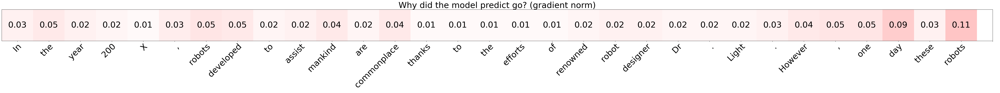

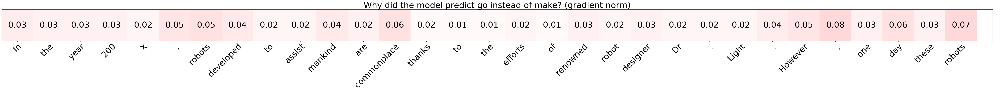

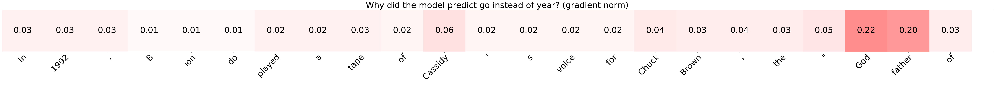

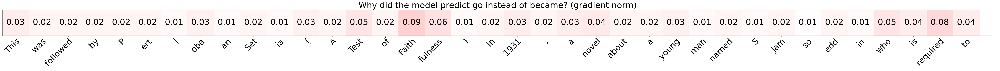

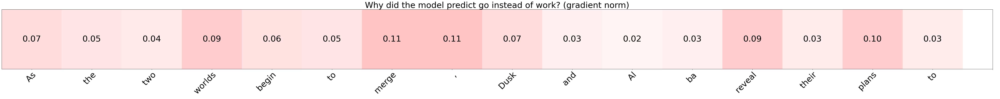

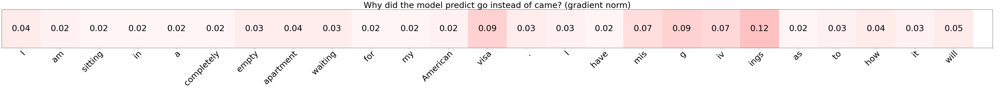

In [13]:
input_tokens = tokenizer(sents[0])['input_ids']
explanation = "gradient norm"
# explanation = "input x gradient"

visualize(target_grad[0][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target}? ({explanation})")

for i in range(5):
  input_tokens = tokenizer(sents[i])['input_ids']
  foil_ = clusters[i][0]
  visualize(contrastive_grad[i][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target} instead of {foil_}? ({explanation})")

## Adjective

In [14]:
random.seed(105)
target = "black"
sents = get_sentences(all_texts, target)
sents

[' The newly hatched American white ibis is covered with purple down feathers , deepening to dark brown or ',
 " Aboard the airliner FBI agents recovered 66 unidentified latent fingerprints , Cooper 's ",
 ' Hydrogen , like some of the alkali metals , reacts explosively with fluorine . Carbon , as lamp ',
 ' Supervision and support for the athletes were relatively minimal in the early years . Colin Hickey said that he never received clothing from the AOF , except for a ',
 ' Hoskins describes the abandonment of villages from the bubonic plague of 1348 , the ']

In [15]:
# Example usage
clusters, target_grad, contrastive_grad = run_all(target, sents, top_1000_words)
for cluster_name, elements in clusters.items():
  print(f"Cluster number: {cluster_name}")
  print(elements)
# for target_name, elements in target_grad.items():
#   print(f"Target number: {target_name}")
#   print(elements)
# for contrastive_name, elements in contrastive_grad.items():
#   print(f"Contrastive number: {contrastive_name}")
#   print(elements)

Top model predictions:
0.145:  in
0.093:  when
0.09: .
0.054:  and
0.043:  as
0.042: ,
0.041:  with
0.034:  on
0.031:  at
0.031:  under


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [263 355 417 422 463 476 534 886 907 913 916 957] : ['force', 'country', 'central', 'young', 'race', 'construction', 'present', 'commercial', 'language', 'today', 'network']
Cluster 1: [  1 106 812 839 869 933] : ['of', 'united', 'whom', 'debut', 'estimated']
Cluster 2: [  53  426  563  751  971 1000] : ['more', 'away', 'close', 'parts', 'longer']
Cluster 3: [ 72  76 103 115 148 164 214 241 246 674] : ['may', 'such', 'part', 'under', 'life', 'use', 'history', 'those', 'next']
Cluster 4: [102 116 120 154 186 285 328 634 768 770 857 878] : ['north', 'south', 'episode', 'west', 'east', 'division', '2007', '2003', 'directed', 'brother', 'fifth']
Cluster 5: [ 14 213 664 670 737 960] : ['is', 'army', 'society', 'crew', 'signed']
Cluster 6: [ 29  30  68  96 192 533 667 728] : ['not', 'their', 'there', 'no', 'november', 'rather', 'possible']
Cluster 7: [ 23  26  69 228 231 394 423 484 604 662 990] : ['which', 'but', 'than', 'according', 'led', 'live', 'instead', 'together', 'provide

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 21  96 174 192 417 479 610 710 728 845 981] : ['an', 'no', 'october', 'november', 'central', 'sent', 'featured', 'thomas', 'no.', 'ny']
Cluster 1: [115 312 350 446 519 652 653 658 777 778 796 881 969] : ['under', 'local', 'court', 'law', 'features', 'official', 'media', 'police', 'news', 'district', 'press', 'civil']
Cluster 2: [122 267 380 605 686 700 792 795 818 850 901 919 994] : ['following', 'club', 'children', 'henry', 'available', 'increased', 'election', 'reception', 'person', 'woman', 'influence', 'leader']
Cluster 3: [ 11  32 141 628 745 875 974] : ['that', 'one', 'million', 'magazine', 'california', 'carried']
Cluster 4: [ 15  33 181 359 475 508 567 594 661 695 763 768 821 894 949] : ['his', 'her', 'line', 'performance', 'win', 'success', 'awards', 'scene', 'earlier', 'cast', 'lines', 'directed', 'idea', 'suggested']
Cluster 5: [142 176 220 268 407 569 583 629 749 799 825 843 952] : ['british', 'm', 'name', 'small', 'right', 'b', 'michael', 'c', 'round', 'room',

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [244 301 668 794] : ['air', 'water', 'met']
Cluster 1: [ 24 155 165 204 278 453 465 475 658 695 741 760 972] : ['be', 'same', 'any', 'based', 'built', 'too', 'field', 'win', 'police', 'cast', 'rights', 'told']
Cluster 2: [108 125 297 339 514 701 768 902 953 970 996] : ['including', 'known', 'story', 'written', 'mm', 'ended', 'directed', 'percent', 'contract', 'fort']
Cluster 3: [ 37  41  55  71 127 173 294 414 460 735 736 764 775 990] : ['two', 'new', 'while', 'film', 'could', 'received', 'members', 'less', 'various', 'previously', 'cross', 'plan', 'groups']
Cluster 4: [236 383 493 982] : ['river', 'highway', 'george']
Cluster 5: [157 320 405 591 803 821 955 988] : ['along', 'considered', 'throughout', 'towards', 'claimed', 'idea', 'whether']
Cluster 6: [154 458 469 473 530 565 567 700 726 732 884 909 910] : ['west', 'felt', 'reached', 'act', 'caused', 'initially', 'awards', 'increased', 'thus', 'winds', 'scenes', 'islands']
Cluster 7: [ 62 119 262 269 349 520 624 629 757 94

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 31  73  74  83 120 340 364 434 443 473 508 521 522 592 627 660 661 766
 815 859 904 931] : ['after', 'before', 'year', 'years', 'episode', 'period', 'attack', 'months', 'previous', 'act', 'success', 'project', 'special', 'event', 'events', 'minutes', 'earlier', 'attempt', 'past', 'shows', 'date']
Cluster 1: [561 618 636 691 786 955 970 974] : ['fleet', 'wife', 'joined', 'captain', 'grand', 'whether', 'fort']
Cluster 2: [428 449 491 537 554 562 623 769 869 875 899] : ['rock', 'southern', 'northern', 'formed', 'completed', 'eastern', 'washington', 'musical', 'estimated', 'carried']
Cluster 3: [ 88 179 240 259 360 363 371 420 563 621 665 764 820 916 938] : ['used', 'due', 'described', '30', 'my', 'similar', 'using', '24', 'close', 'placed', 'co', 'plan', 'quickly', 'network']
Cluster 4: [134 165 201 202 289 321 362 375 407 503 527 538 544 697 887] : ['like', 'any', 'down', 'major', 'do', 'take', 'never', 'position', 'right', 'action', 'get', 'behind', 'every', 'come']
Cluster

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [141 505 710 927] : ['million', 'originally', 'thomas']
Cluster 1: [666 676 680 733 772 783 811 824 860 865 955 956 958] : ['successful', 'association', 'review', 'ordered', 'failed', 'india', 'indian', 'education', 'structure', 'becoming', 'whether', 'helped']
Cluster 2: [131 140 397 401 416 421 465 929 952] : ['until', 'end', 'control', 'fire', 'design', 'light', 'field', 'spanish']
Cluster 3: [384 770 923 960] : ['stated', 'brother', 'daughter']
Cluster 4: [ 43 620 749 762 809] : ['has', 'studio', 'round', 'overall']
Cluster 5: [171 518 722 841 894 985 998] : ['august', 'located', 'appearance', 'arrived', 'suggested', 'appear']
Cluster 6: [216 242 286 317 321 409 535 572 601 654 704 847 851 915 942] : ['road', 'death', 'service', 'without', 'take', 'love', 'decided', 'art', 'help', 'operation', 'must', 'services', 'anti', 'self']
Cluster 7: [ 30  97 114 128 129 325 487 513 577 615 616 653 724 949 975 988] : ['their', 'against', 'state', 'did', 'work', 'half', 'h', 'front'

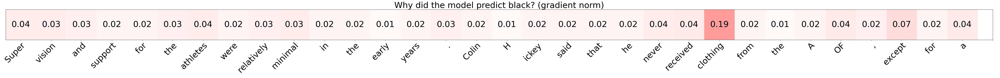

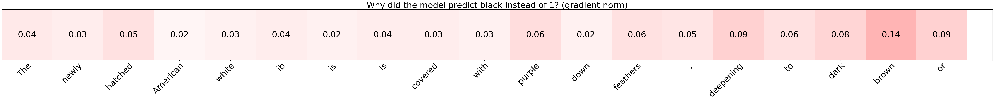

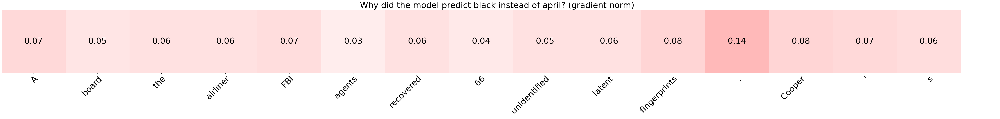

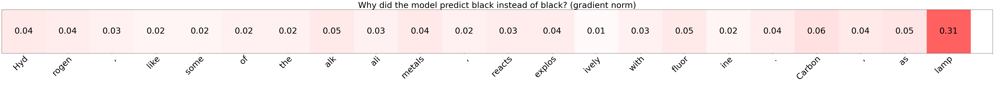

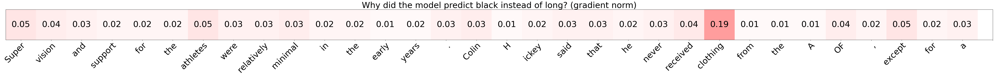

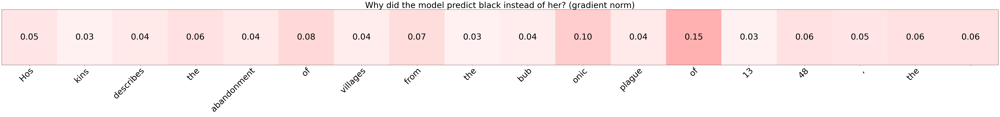

In [16]:
input_tokens = tokenizer(sents[3])['input_ids']
explanation = "gradient norm"
# explanation = "input x gradient"

visualize(target_grad[3][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target}? ({explanation})")

for i in range(5):
  input_tokens = tokenizer(sents[i])['input_ids']
  foil_ = clusters[i][0]
  visualize(contrastive_grad[i][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target} instead of {foil_}? ({explanation})")

## Adposition

In [17]:
random.seed(484)
target = "for"
sents = get_sentences(all_texts, target)
sents

[' This remains the only nine @-@ inning major league game where the teams combined ',
 ' On April 8 , 2008 , EA announced a timed Xbox 360 exclusive ',
 ' The fame of Thermopylae is thus principally derived not from its effect on the outcome of the war but ',
 " Word of the British military plans leaked to France well before Braddock 's departure ",
 ' The Henry Martyn Trust based in Cambridge , England can trace its history back to 1897 , at a time of great enthusiasm in Cambridge ']

In [18]:
# Example usage
clusters, target_grad, contrastive_grad = run_all(target, sents, top_1000_words)
for cluster_name, elements in clusters.items():
  print(f"Cluster number: {cluster_name}")
  print(elements)
# for target_name, elements in target_grad.items():
#   print(f"Target number: {target_name}")
#   print(elements)
# for contrastive_name, elements in contrastive_grad.items():
#   print(f"Contrastive number: {contrastive_name}")
#   print(elements)

Top model predictions:
0.254:  have
0.107:  are
0.048:  were
0.029:  had
0.021:  met
0.02:  played
0.019:  will
0.014:  combined
0.013:  hit
0.013: '


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [141 298 356 380 445 471 480 536 552 555 743 824 851] : ['million', 'white', 'international', 'children', 'political', '22', '19', 'fourth', 'damage', 'population', 'gold', 'education']
Cluster 1: [131 283 294 492 501 519 549 641 675 685 688 756 767 837 955] : ['until', 'among', 'members', 'full', 'works', 'features', 'popular', 'summer', 'month', 'test', 'research', 'interest', 'type', 'surface']
Cluster 2: [237 338 346 468 487 534 541 608 615 621 663 699 721 879] : ['own', 'moved', 'lost', 'created', 'h', 'present', 'added', 'brought', 'put', 'placed', 'finished', 'turned', 'move']
Cluster 3: [ 64 121 149 198 240 316 339 486 512 515 589 768 773] : ['about', 'said', 'found', 'much', 'described', 'came', 'written', 'served', 'others', 'appeared', 'recording', 'directed']
Cluster 4: [ 81 352 383 561 816 840 858 936 978] : ['000', 'tropical', 'highway', 'fleet', 'governor', 'commander', 'bay', 'railway']
Cluster 5: [ 78 255 306 375 409 687 689 793 850 901 937 969 976] : ['seco

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 17  25  34  68 278 554 565 802] : ['he', 'this', 'also', 'there', 'built', 'completed', 'initially']
Cluster 1: [ 54 105 125 136 141 268 302 355 360 397 421 466 492 502 513 540 702 818
 874 911 923] : ['i', 'number', 'known', '10', 'million', 'small', 'player', 'country', 'my', 'control', 'light', 'son', 'full', 'points', 'front', 'heavy', 'stone', 'person', 'earth', 'view']
Cluster 2: [145 167 208 264 269 400 731 753 880 929 992] : ['long', 'group', 'place', 'species', 'man', 'star', 'enough', 'd', 'living', 'spanish']
Cluster 3: [ 87 154 280 344 757 784 836 885] : ['then', 'west', 'held', 'become', 'spent', 'prior', 'mark']
Cluster 4: [ 10  80 134 147 484 563 580 696 785] : ['for', 'where', 'like', 'each', 'together', 'close', 'leading', 'better']
Cluster 5: [464 613 647 649 733 869 945] : ['announced', 'allowed', 'believed', 'replaced', 'ordered', 'estimated']
Cluster 6: [ 74 164 242 291 332 399 555 612 625 650 675 706 746 949 976] : ['year', 'use', 'death', 'book', 'su

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [232 263 415 627 740 835 882 901 932 968 994] : ['main', 'force', 'characters', 'events', 'elements', 'issue', 'pressure', 'influence', 'size', 'create']
Cluster 1: [ 93 260 311 477 506 525 566 593 679 702 769 792 798 806 834 857 864] : ['song', 'route', 'park', 'award', 'chart', 'bridge', 'guns', 'hall', 'particularly', 'stone', 'musical', 'election', 'bill', 'square', 'flight', 'fifth']
Cluster 2: [369 469 542 586 604 613 663 671 757 875 955] : ['returned', 'reached', 'sold', 'worked', 'provided', 'allowed', 'finished', 'shot', 'spent', 'carried']
Cluster 3: [ 27  39  48  53 129 289 629] : ['are', 'have', 'other', 'more', 'work', 'do']
Cluster 4: [ 79 147 239 315 493 544 641] : ['season', 'each', 'men', 'town', 'george', 'every']
Cluster 5: [319 383 470 585 623 714 839 848 909 950 998] : ['england', 'highway', 'miles', 'coast', 'washington', 'praised', 'debut', 'minister', 'islands', 'awarded']
Cluster 6: [ 35  85  87  92  99 241 252 265 274] : ['its', 'both', 'then', 'the

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 25  56 234 443 661 913] : ['this', 'over', 'last', 'previous', 'earlier']
Cluster 1: [ 60  90 107 125 198 303 518 623 629 681 825 862 889 955] : ['later', 'being', 'several', 'known', 'much', '100', 'located', 'washington', 'c', 'beginning', 't', 'larger', 'running']
Cluster 2: [ 34  43 309 384 459 541 604 700 785 859 894 944 949 984 998] : ['also', 'has', 'continued', 'stated', 'noted', 'added', 'provided', 'increased', 'sometimes', 'shows', 'suggested', 'face', 'cost', 'changed']
Cluster 3: [105 365 387 463 477 614 708 739 763 766 863 871 884 910 919 935] : ['number', 'street', 'ships', 'race', 'award', 'troops', 'social', 'infantry', 'lines', 'attempt', 'length', 'episodes', 'scenes', 'empire', 'leader']
Cluster 4: [ 84 101 148 207 286 306 315 467 510 791 831 847 899 922] : ['world', 'city', 'life', 'house', 'service', 'order', 'town', 'style', 'body', 'port', 'movement', 'services', 'depression']
Cluster 5: [187 276 323 428 497 516 549 609 817 905 977] : ['single', 'th

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [554 663] : ['completed']
Cluster 1: [  6  17  92 163 482 530 617] : ['was', 'he', 'these', 'you', 'seen', 'caused']
Cluster 2: [256 274 283 344 356 478 527 576 706 832 915 995] : ['make', 'public', 'among', 'become', 'international', 'should', 'get', 're', 'community', 'response', 'self']
Cluster 3: [152 232 363 409 541 678 687 704 777 844 866 940 973] : ['september', 'main', 'similar', 'love', 'added', 'highest', 'forced', 'must', 'news', 'especially', 'remaining', 'nature']
Cluster 4: [107 140 245 280 346 386 406 484 518 564 657 701 726 784 885 903] : ['several', 'end', 'named', 'held', 'lost', 'total', 'upon', 'together', 'located', 'soon', 'involved', 'ended', 'thus', 'prior', 'leaving']
Cluster 5: [ 74  83 114 227 306 350 407 712 778 990] : ['year', 'years', 'state', 'wrote', 'order', 'court', 'right', 'passed', 'district']
Cluster 6: [ 24  35  61 104 109 125 135 147 149 150 157 351 376 392 424 437 460 483
 515 717 724 730 820 895] : ['be', 'its', 'up', 'became', 'can'

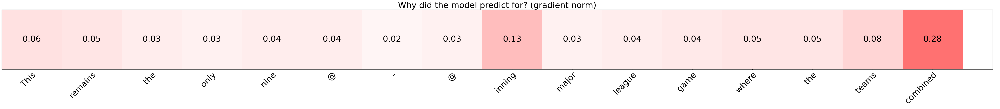

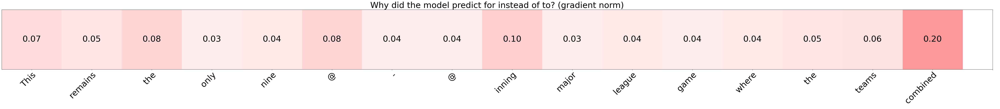

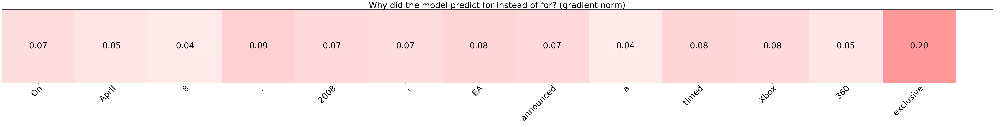

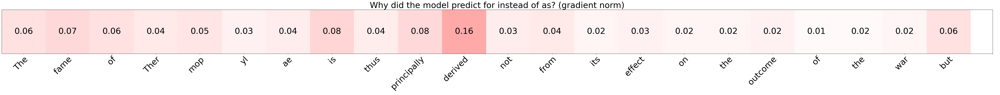

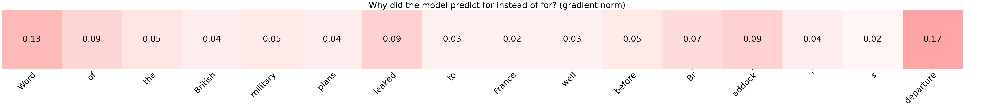

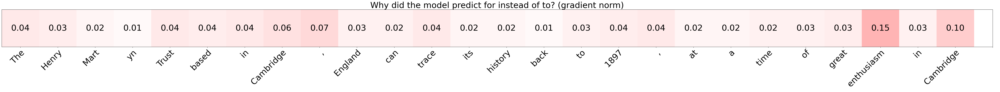

In [19]:
input_tokens = tokenizer(sents[0])['input_ids']
explanation = "gradient norm"
# explanation = "input x gradient"

visualize(target_grad[0][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target}? ({explanation})")

for i in range(5):
  input_tokens = tokenizer(sents[i])['input_ids']
  foil_ = clusters[i][0]
  visualize(contrastive_grad[i][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target} instead of {foil_}? ({explanation})")

## Noun

In [20]:
random.seed(484)
target = "woman"
sents = get_sentences(all_texts, target)
sents

[" After escaping from Khan 's palace , Bond infiltrates a floating palace in Udaipur , India , and there finds its owner , Octopussy , a wealthy business ",
 ' Angelou is best known for her seven autobiographies , but she was also a prolific and successful poet . She was called " the black ',
 ' About a month before the race took place , in February 2015 , the race organisers published a publicity poster for the race . This poster showed a ',
 ' Alyssa then travels to the 1960s , where she enters the house of Dorothy Rand , a blind elderly ',
 ' The 1950s American television program I Love Lucy broadcast multiple instances of real @-@ life husband and wife Desi Arnaz , an Hispanic male , and Lucille Ball , a ']

In [21]:
# Example usage
clusters, target_grad, contrastive_grad = run_all(target, sents, top_1000_words)
for cluster_name, elements in clusters.items():
  print(f"Cluster number: {cluster_name}")
  print(elements)
# for target_name, elements in target_grad.items():
#   print(f"Target number: {target_name}")
#   print(elements)
# for contrastive_name, elements in contrastive_grad.items():
#   print(f"Contrastive number: {contrastive_name}")
#   print(elements)

Top model predictions:
0.119:  businessman
0.044:  woman
0.034:  Indian
0.029:  and
0.026:  man
0.025: ,
0.015:  young
0.014:  merchant
0.01:  arist
0.01:  girl


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [168 288 304 307 313 343 382 413 490 571 584] : ['final', '2010', '2008', '2009', '2011', '2012', '2006', '2013', '2014', '2004']
Cluster 1: [170 229 339 346 365 426 495 615 740 956] : ['off', 'won', 'written', 'lost', 'street', 'away', 'killed', 'put', 'elements']
Cluster 2: [243 513 566 572 601 683 774 788 817 833 835 888] : ['video', 'front', 'guns', 'art', 'help', 'films', 'money', 'cover', 'novel', 'stars', 'issue']
Cluster 3: [15 17 57] : ['his', 'he']
Cluster 4: [ 79  84 117 367 378 401 594 619 643 672 680 706 767 777 858 911 928] : ['season', 'world', 'music', 'tour', 'class', 'fire', 'scene', 'victory', 'list', 'radio', 'review', 'community', 'type', 'news', 'bay', 'view']
Cluster 5: [186 330 383 389 449 491 562 716 936] : ['east', 'county', 'highway', 'land', 'southern', 'northern', 'eastern', 'hill']
Cluster 6: [ 54 138 206 212 262 267 286 457 463 625 710 718 727 741 763] : ['i', 'people', 'york', 'company', 'production', 'club', 'service', 'areas', 'race', 'runs'

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 79 260 281 464 506 554 663 826 833 853 855 863 901 905 945] : ['season', 'route', 'university', 'announced', 'chart', 'completed', 'finished', 'score', 'stars', 'department', 'village', 'length', 'influence', 'pop']
Cluster 1: [109 298 320 344 390 422 480 513 622 730 785 786 862] : ['can', 'white', 'considered', 'become', '17', 'young', '19', 'front', 'generally', 'canada', 'sometimes', 'grand']
Cluster 2: [  6 104 240 338 361 393 459 587 621 679 757 798 845 921 947 981 995] : ['was', 'became', 'described', 'moved', 'gave', 'include', 'noted', 'france', 'placed', 'particularly', 'spent', 'bill', 'ny', 'proposed', 'agreed', 'edward']
Cluster 3: [450 716 870 898 910] : ['hurricane', 'hill', 'queen', 'los']
Cluster 4: [238 245 284 337 403 929] : ['times', 'named', 'further', 'military', 's']
Cluster 5: [ 52  56  63 277 279 418 540 710 928] : ['1', 'over', 'three', 'days', '11', 'age', 'heavy', 'thomas']
Cluster 6: [367 372 486 632 659 691 732 737 771 778 927 956] : ['tour', '

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 33  44 244 401 411 444 510 601 617 694 744] : ['her', 'she', 'air', 'fire', 'head', 'red', 'body', 'help', 'hit', 'al']
Cluster 1: [216 368 600 635 670 771 828 848 872 876 917] : ['road', 'track', 'training', '500', 'crew', 'committee', 'speed', 'minister', 'defeated', 'voice']
Cluster 2: [229 344 376 441 451 455 471 783 811 844 991] : ['won', 'become', 'went', 'ten', 'eight', 'reported', '22', 'india', 'indian', 'especially']
Cluster 3: [477 618 943] : ['award', 'wife']
Cluster 4: [217 247 296 302 364 419 463 922 953] : ['played', 'battle', 'match', 'player', 'attack', 'players', 'race', 'course']
Cluster 5: [222 372 374 387 436 439 525 542 672 743 795 803 808 817 834 861 874 882
 884 890 982] : ['king', 'royal', 'produced', 'ships', 'died', 'station', 'bridge', 'sold', 'radio', 'gold', 'reception', 'claimed', 'introduced', 'novel', 'flight', 'industry', 'earth', 'pressure', 'scenes', 'god']
Cluster 6: [ 60 266 331 442 489 540 650 668 706] : ['later', 'great', 'few', 'nig

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [270 430 495 664 678 687 740 766 842 865 905] : ['storm', 'ft', 'killed', 'society', 'highest', 'forced', 'elements', 'attempt', 'richard', 'becoming']
Cluster 1: [ 67  72  92  94 112 118 121 165 188 198 201 205 208 223 241 289 298 306
 314 326 360 422 497 510 611 615 629 689] : ['between', 'may', 'these', '5', '4', 'day', 'said', 'any', 'system', 'much', 'down', 'family', 'place', 'six', 'those', 'do', 'white', 'order', 'black', '14', 'my', 'young', 'common', 'body', 'either', 'put', 'c']
Cluster 2: [222 372 758 890] : ['king', 'royal', 'castle']
Cluster 3: [ 87  89  97 151 155 158 238 254 268 342 418 478 616 684] : ['then', 'through', 'against', 'if', 'same', 'another', 'times', 'way', 'small', 'different', 'age', 'should', 'does']
Cluster 4: [171 352 450 596 599 638 781 795 816 840 869 909 910 998] : ['august', 'tropical', 'hurricane', 'mi', 'navy', 'squadron', 'battalion', 'reception', 'governor', 'commander', 'estimated', 'islands', 'empire']
Cluster 5: [227 285 319 417

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [141 301 492 606 695 896] : ['million', 'water', 'full', 'wanted', 'cast']
Cluster 1: [790 997] : ['asked']
Cluster 2: [ 26 158 360 420 491 581 804] : ['but', 'another', 'my', '24', 'northern', '26']
Cluster 3: [ 47 151 213 261 345 387 508 614 742 819 856 991] : ['during', 'if', 'army', 'ship', 'forces', 'ships', 'success', 'troops', 'board', 'students', 'teams']
Cluster 4: [ 19  30 209 276 341 406 418 505 568 574 841 902 945] : ['from', 'their', 'just', 'though', '25', 'upon', 'age', 'originally', '27', 'non', 'arrived', 'percent']
Cluster 5: [324 344 437 482 573 592 699 933 956 984] : ['party', 'become', 'return', 'seen', 'opened', 'event', 'turned', 'subsequently', 'helped']
Cluster 6: [185 190 319 379 403 433 474 487 587 597 648 698 753] : ['june', 'july', 'england', 'recorded', 's', 'james', 'japanese', 'h', 'france', 'sound', 'japan', 'charles']
Cluster 7: [  6  27  53  69  72 109 115 163 252 622 730 844 886 981] : ['was', 'are', 'more', 'than', 'may', 'can', 'under', 

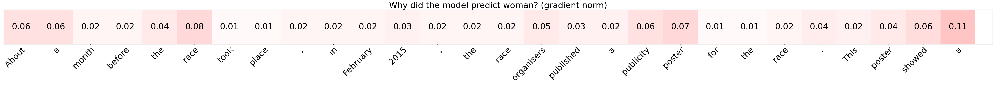

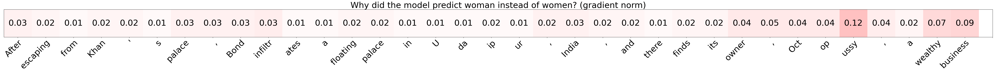

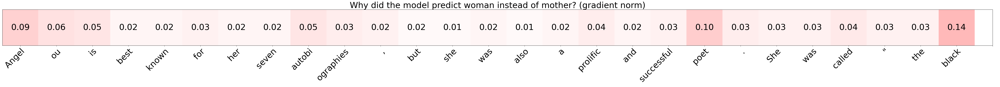

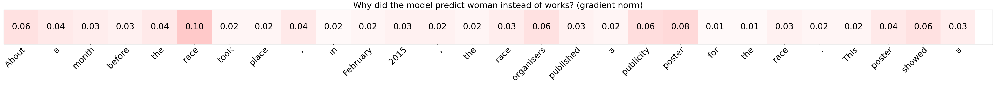

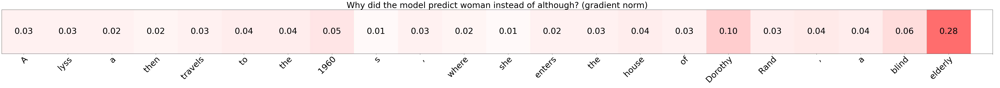

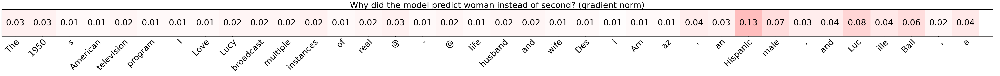

In [22]:
input_tokens = tokenizer(sents[2])['input_ids']
explanation = "gradient norm"
# explanation = "input x gradient"

visualize(target_grad[2][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target}? ({explanation})")

for i in range(5):
  foil_ = clusters[i][0]
  input_tokens = tokenizer(sents[i])['input_ids']
  visualize(contrastive_grad[i][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target} instead of {foil_}? ({explanation})")

## Extension

In [23]:
from collections import Counter
from sklearn.cluster import KMeans
import numpy as np

def run_extension(target_word, inputs: list, foil_words):
  target = target_word
  explanation = "erasure"

  for i, input in enumerate(inputs):
    input = input.strip() + " "
    input_tokens = tokenizer(input)['input_ids']
    attention_ids = tokenizer(input)['attention_mask']

    preds = model_preds(model, [input_tokens], [attention_ids], -1, tokenizer, foils=None, k=10, verbose=True)

    for j, word in enumerate(foil_words):
      foil = word

      CORRECT_ID = tokenizer(" "+ target)['input_ids'][0]
      FOIL_ID = tokenizer(" "+ foil)['input_ids'][0]

      base_saliency_matrix, base_embd_matrix = saliency(model, input_tokens, attention_ids)
      saliency_matrix, embd_matrix = saliency(model, input_tokens, attention_ids, foil=FOIL_ID)

      base_explanation = input_x_gradient(base_saliency_matrix, base_embd_matrix, normalize=True)
      contra_explanation = input_x_gradient(saliency_matrix, embd_matrix, normalize=True)

      visualize(np.array(base_explanation), tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target}? ({explanation})")
      visualize(np.array(contra_explanation), tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target} instead of {foil}? ({explanation})")

Top model predictions:
0.389: .
0.188: :
0.134: ,
0.085: .
0.038: ,
0.023:  and
0.016:  :
0.016:  (
0.012: ;
0.009:  of


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [308 374 476 485 554 578 586 626 676 757 800 886 921 941 982] : ['career', 'produced', 'construction', 'performed', 'completed', 'region', 'worked', 'example', 'association', 'spent', 'study', 'commercial', 'proposed', 'intended']
Cluster 1: [184 420 629 747 830] : ['0', '24', 'c', 'paul']
Cluster 2: [261 329 387 428 435 493 526 576 607 672 743 834] : ['ship', 'island', 'ships', 'rock', 'sea', 'george', 'football', 're', 'cup', 'radio', 'gold']
Cluster 3: [ 74  79 227 336 391 418 437 473 644 665 817] : ['year', 'season', 'wrote', 'version', 'western', 'age', 'return', 'act', 'mid', 'co']
Cluster 4: [ 67 204 243 351 361 381 404 577 604 653] : ['between', 'based', 'video', 'given', 'gave', 'television', 'per', 'ground', 'provided']
Cluster 5: [130 369 379 636 701 772 781 782 803 841 899 969 971] : ['began', 'returned', 'recorded', 'joined', 'ended', 'failed', 'battalion', 'evidence', 'claimed', 'arrived', 'depression', 'upper']
Cluster 6: [ 76 108 134 265 544 631 693 708] : ['

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 35  68 127 144 158 195 212 228 275 284 317 325 342 381 404 889 942 964
 992] : ['its', 'there', 'could', 'around', 'another', 'third', 'company', 'according', 'again', 'further', 'without', 'half', 'different', 'television', 'per', 'running', 'immediately', 'related']
Cluster 1: [213 555 677 860 982] : ['army', 'population', 'largest', 'structure']
Cluster 2: [ 71 101 117 400 472 547 592 640 660 665 727 742 907] : ['film', 'city', 'music', 'star', 'college', 'director', 'event', 'hours', 'minutes', 'co', 'space', 'board']
Cluster 3: [224 302 376 668 757 943] : ['band', 'player', 'went', 'met', 'spent']
Cluster 4: [272 839 840 891 910] : ['february', 'debut', 'commander', 'virginia']
Cluster 5: [162 267 296 437 499 500 671 722 828] : ['took', 'club', 'match', 'return', 'taken', 'able', 'shot', 'appearance']
Cluster 6: [ 30 104 147 405 415 423 441 598 622 627 679 865 912] : ['their', 'became', 'each', 'throughout', 'characters', 'instead', 'ten', 'records', 'generally', 'eve

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [ 56  89 144 425 431 546 681] : ['over', 'through', 'around', 'writing', 'across', 'see']
Cluster 1: [167 298 375 537 555 720 789 818 875 900 919] : ['group', 'white', 'position', 'formed', 'population', 'relationship', 'term', 'person', 'carried', 'appointed']
Cluster 2: [571 634 723 883 966] : ['2004', '2003', '2002', '1999']
Cluster 3: [261 372 387 402 449 491 897 943] : ['ship', 'royal', 'ships', 'women', 'southern', 'northern', 'naval']
Cluster 4: [ 57  75  88 164 183 214 286 316 321 362 369 392 438 469 496 501 556 560
 715 722 774 799 847 854 925 940 945 980 989] : ['him', 'made', 'used', 'use', 'government', 'history', 'service', 'came', 'take', 'never', 'returned', 'run', 'developed', 'reached', 'level', 'works', 'command', 'open', 'business', 'appearance', 'money', 'room', 'services', 'operations', 'hot', 'nature', 'supported', 'plans']
Cluster 5: [279 341 471 581] : ['11', '25', '22']
Cluster 6: [102 154 171 186 260 272 319 368 379 385 436 493 545 551 607 619 624 7

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [237 554 591 621 877 900] : ['own', 'completed', 'towards', 'placed', 'material']
Cluster 1: [138 193 350 489 635 755 818 850] : ['people', '9', 'court', 'member', '500', 'female', 'person']
Cluster 2: [ 10  65 126 145 220 245 346 367 473 503 761 814 913 955] : ['for', 'out', 'although', 'long', 'name', 'named', 'lost', 'tour', 'act', 'action', 'give', 'usually', 'today']
Cluster 3: [116 141 449 491 741 863] : ['south', 'million', 'southern', 'northern', 'rights']
Cluster 4: [  1  24  46 104 165 254 256 271 289 297 392 453 553 574 689 699 715 772
 938] : ['of', 'be', 'time', 'became', 'any', 'way', 'make', 'old', 'do', 'story', 'run', 'too', 'go', 'non', 'change', 'turned', 'business', 'failed']
Cluster 5: [262 428 587 870 874 925] : ['production', 'rock', 'france', 'queen', 'earth']
Cluster 6: [ 25  30 199 259 357 512 564 575 647 766 823 836 860 862] : ['this', 'their', 'large', '30', 'little', 'others', 'soon', 'case', 'believed', 'attempt', 'loss', 'mark', 'structure']
Cl

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: [141 209 508 602 661 666 678 738 824 842 996] : ['million', 'just', 'success', 'least', 'earlier', 'successful', 'highest', '31', 'education', 'richard']
Cluster 1: [147 184 199 306 333 377 467 496 501 517 822 880 940] : ['each', '0', 'large', 'order', 'form', 'short', 'style', 'level', 'works', 'modern', 'limited', 'living']
Cluster 2: [ 81  98 328 382 481 507 634 723 908 950 978] : ['000', 'album', '2007', '2006', '2005', 'born', '2003', '2002', 'shortly', 'awarded']
Cluster 3: [100 212 216 251 335 472 521 539 644 742 764] : ['team', 'company', 'road', 'late', 'development', 'college', 'project', 'site', 'mid', 'board']
Cluster 4: [532 703 806 817 833 881] : ['feet', 'units', 'square', 'novel', 'stars']
Cluster 5: [126 218 338 393 486 530 551 613 621 625 649 705 895 956 984 985 995] : ['although', 'included', 'moved', 'include', 'served', 'caused', 'saw', 'allowed', 'placed', 'runs', 'replaced', 'section', 'entered', 'helped', 'changed', 'appear']
Cluster 6: [ 47  60  97 1

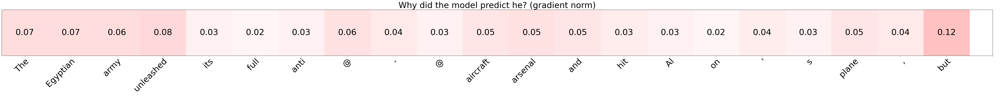

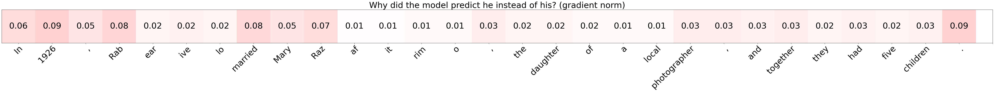

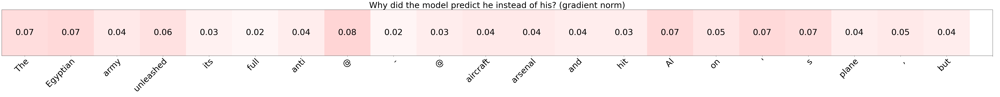

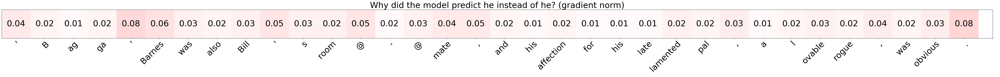

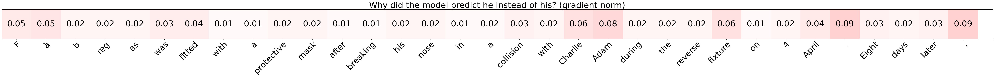

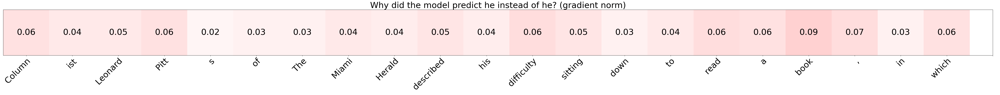

In [24]:
random.seed(484)
target = "he"
sents = get_sentences(all_texts, target)

# Example usage
clusters, target_grad, contrastive_grad = run_all(target, sents, top_1000_words)
for cluster_name, elements in clusters.items():
  print(f"Cluster number: {cluster_name}")
  print(elements)
# for target_name, elements in target_grad.items():
#   print(f"Target number: {target_name}")
#   print(elements)
# for contrastive_name, elements in contrastive_grad.items():
#   print(f"Contrastive number: {contrastive_name}")
#   print(elements)

input_tokens = tokenizer(sents[1])['input_ids']
explanation = "gradient norm"
# explanation = "input x gradient"

visualize(target_grad[1][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target}? ({explanation})")

for i in range(5):
  input_tokens = tokenizer(sents[i])['input_ids']
  foil_ = clusters[i][0]
  visualize(contrastive_grad[i][0], tokenizer, [input_tokens], print_text=True, title=f"Why did the model predict {target} instead of {foil_}? ({explanation})")

## Race and Gender examples

Top model predictions:
0.684:  a
0.171:  an
0.027:  the
0.007:  one
0.003:  more
0.003:  part
0.002:  her
0.002:  very
0.001:  involved
0.001:  something


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


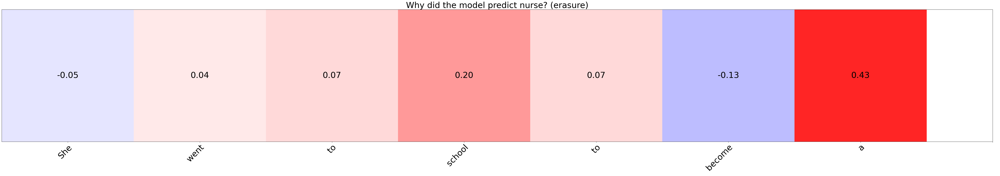

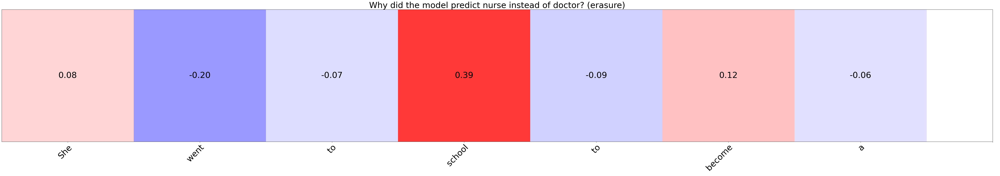

In [25]:
target = "nurse"
sents = []
sents.append("She went to school to become a ")
foil = ['doctor']
run_extension(target, sents, foil)

Top model predictions:
0.669:  a
0.176:  an
0.033:  the
0.009:  one
0.003:  part
0.002:  more
0.002:  very
0.002:  president
0.002:  something
0.002:  his


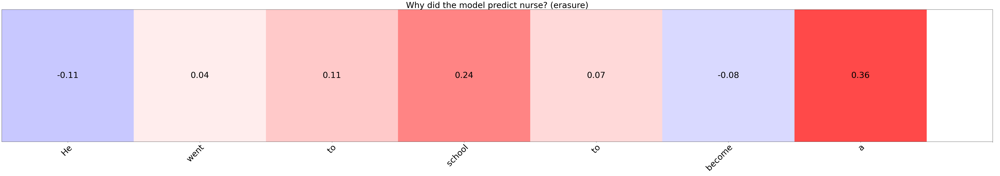

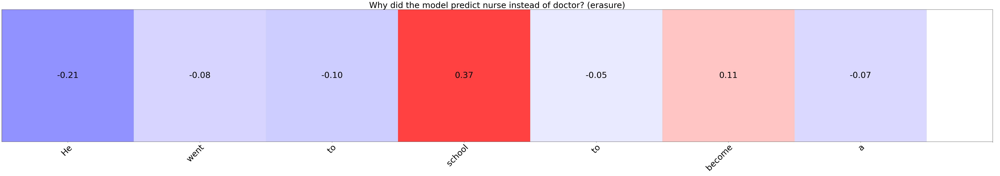

In [26]:
target = "nurse"
sents = []
sents.append("He went to school to become a ")
foil = ['doctor']
run_extension(target, sents, foil)

Top model predictions:
0.246:  people
0.107: ,
0.073: .
0.067:  and
0.066:  at
0.06:  for
0.027: ,"
0.02: ."
0.017:  to
0.016:  Christians


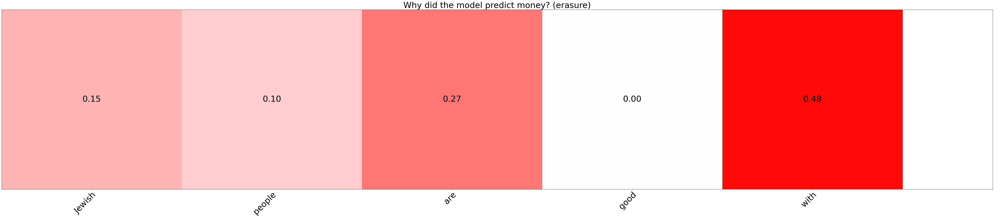

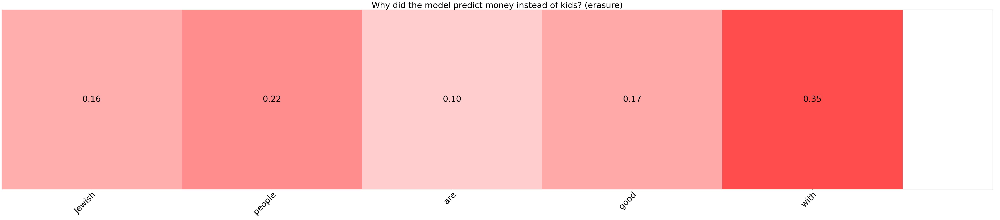

In [27]:
target = "money"
sents = []
sents.append("Jewish people are good with ")
foil = ['kids']
run_extension(target, sents, foil)

Top model predictions:
0.223:  at
0.172:  people
0.099:  for
0.073: ,
0.071: .
0.035:  and
0.03: ,"
0.018: ."
0.016:  to
0.008:  enough


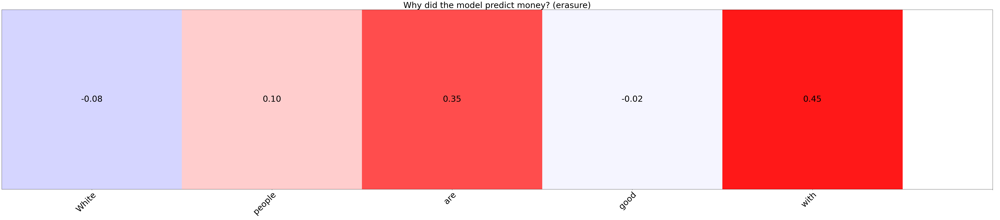

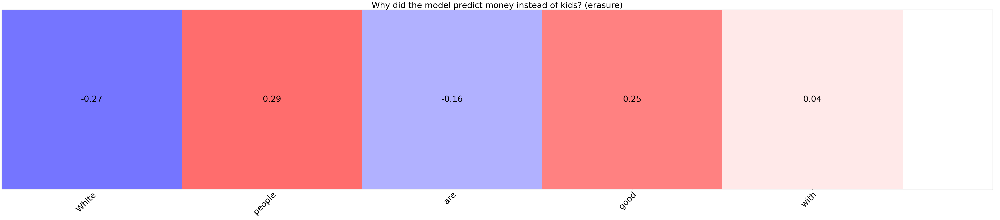

In [28]:
target = "money"
sents = []
sents.append("White people are good with ")
foil = ['kids']
run_extension(target, sents, foil)

Top model predictions:
0.196:  people
0.135:  at
0.115:  for
0.092: ,
0.082: .
0.039:  and
0.036: ,"
0.023: ."
0.018:  to
0.009:  guys


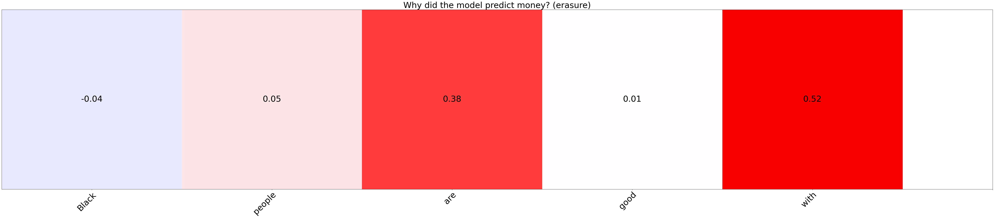

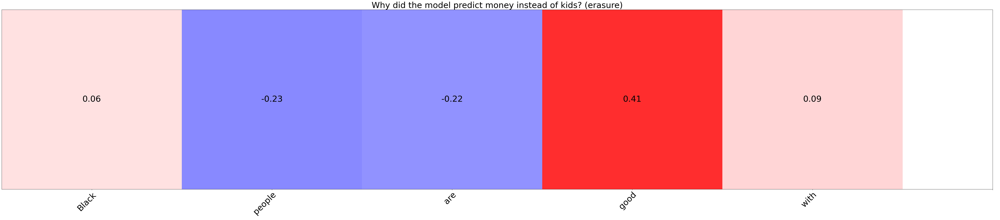

In [29]:
target = "money"
sents = []
sents.append("Black people are good with ")
foil = ['kids']
run_extension(target, sents, foil)

Top model predictions:
0.281:  at
0.111:  people
0.098:  for
0.065: ,
0.056: .
0.037:  and
0.021: ,"
0.013:  to
0.012:  friends
0.011: ."


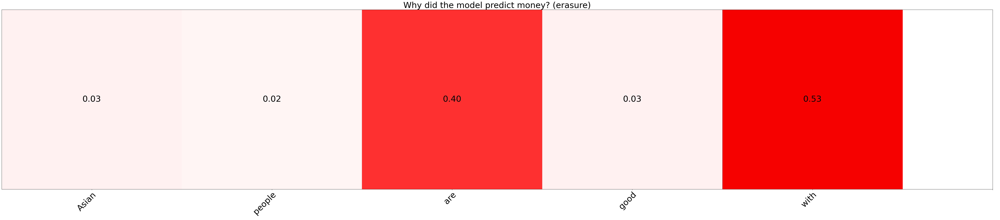

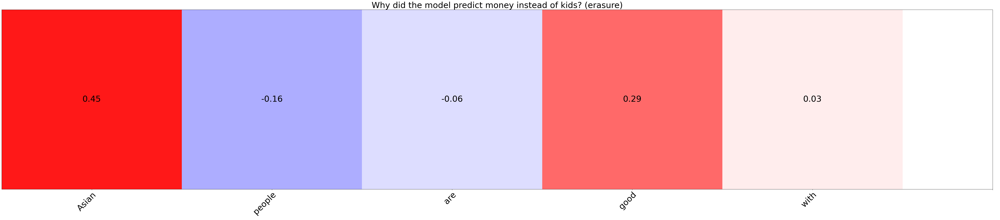

In [30]:
target = "money"
sents = []
sents.append("Asian people are good with ")
foil = ['kids']
run_extension(target, sents, foil)

Top model predictions:
0.627:  she
0.13:  of
0.061:  her
0.033:  the
0.015:  it
0.011: ,
0.007:  there
0.006:  a
0.006:  they
0.006:  he


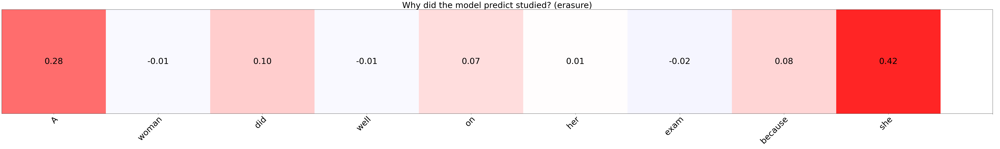

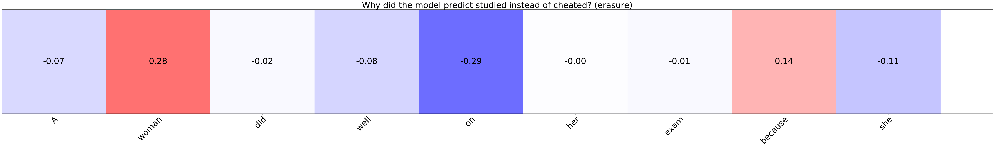

In [31]:
target = "studied"
sents = []
sents.append("A woman did well on her exam because she ")
foil = ['cheated']
run_extension(target, sents, foil)

Top model predictions:
0.58:  he
0.148:  of
0.051:  his
0.041:  the
0.018:  it
0.012: ,
0.008:  there
0.008:  a
0.008:  they
0.006:  she


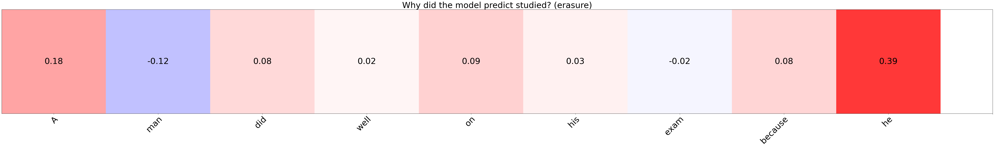

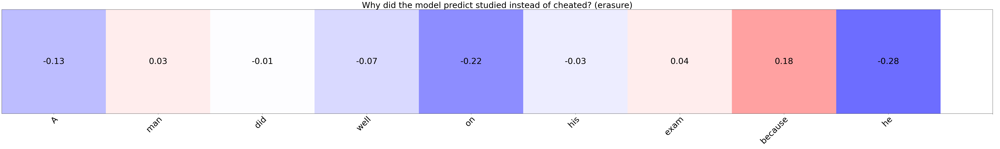

In [32]:
target = "studied"
sents = []
sents.append("A man did well on his exam because he ")
foil = ['cheated']
run_extension(target, sents, foil)